# Импорт зависимостей

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
import os
import sys
sys.path.append(os.pardir)
STYLEGAN_DIR = os.path.join(os.pardir, "src", "stylegan2_ada_pytorch")
sys.path.append(STYLEGAN_DIR)

from PIL import Image
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch.nn as nn

from src.stylegan2_ada_pytorch.stylegan2_models.image_aligner.face_alignment import image_align
from src.stylegan2_ada_pytorch.stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector
from src.losses import RegLoss, LpipsLoss, RecLoss
from src.utils import image2tensor_norm, broadcast_w_sg, plot_image, get_image, interpolate

In [3]:
import warnings
warnings.filterwarnings('ignore')

## Кроп изображений

In [4]:
STYLEGAN_DIR = os.path.join(os.pardir, "src", "stylegan2_ada_pytorch")
landmarks_model_path = os.path.join(STYLEGAN_DIR, "pretrained_models", "shape_predictor_68_face_landmarks.dat")
RAW_IMAGES_DIR = os.path.join(os.pardir, "raw_images")
ALIGNED_IMAGES_DIR = os.path.join(os.pardir, "aligned_images")
STYLES_DIR = os.path.join(os.pardir, "styles")

landmarks_detector = LandmarksDetector(landmarks_model_path)
for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

## Проекция изображений

In [5]:
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms

e4e_model, _ = load_e4e_standalone(os.path.join(STYLEGAN_DIR, "pretrained_models", "e4e_ffhq_encode.pt"))

image2e4etensor = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize((256, 256)),
                                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

In [6]:
seed = 2345645
noise_mode = 'const' # шум
label = 0 # для разных моделей
device = "cuda:0"
model_path = os.path.join(STYLEGAN_DIR, "pretrained_models", "ffhq.pkl")

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

In [7]:
def project_image_to_latent_space(target_img_dir):
    # Device on which to perform the computation
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load target image
    target_pil = Image.open(target_img_dir).convert('RGB')
    preprocess = Compose([
        Resize((1024, 1024)),  # Assuming the model works with 1024x1024 images
        ToTensor(),
        Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])
    target_tensor = preprocess(target_pil).to(device).unsqueeze(0)

    e4e_tensor = image2e4etensor(target_pil).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)

    # Initialize loss functions
    lpips_loss = LpipsLoss(device)
    rec_loss = RecLoss()
    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name}
    reg_loss = RegLoss(noise_bufs)

    # Loss weights
    regularize_noise_weight = 5e5
    rec_weight = 0.5
    lpips_weight = 1

    # Optimization parameters
    seed = 42
    w_avg_samples = 10000
    num_steps = 100
    initial_learning_rate = 0.01
    
    initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)
    
    # Initialize w_opt with w_avg
    w_opt = torch.tensor(initial_latent_vector, dtype=torch.float32, device=device, requires_grad=True)

    optimizer = torch.optim.Adam([w_opt], lr=initial_learning_rate)
    generated_tensors = []
    for step in tqdm(range(num_steps)):
        optimizer.zero_grad()
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')

        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        reg_value = reg_loss()

        loss = lpips_value * lpips_weight + rec_value * rec_weight + reg_value * regularize_noise_weight

        loss.backward()
        optimizer.step()

        generated_tensors.append(synth_tensor.detach())

    generated_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const', force_fp32=True)

    return target_tensor, generated_tensor, w_opt

In [8]:
SAVE_PATH = os.path.join(os.pardir, "latents")

# Lists to store image plots
original_imgs = []
projected_imgs = []
latents = []

for persone in sorted(os.listdir(ALIGNED_IMAGES_DIR)):
    person_images = os.path.join(ALIGNED_IMAGES_DIR, persone)
    save_folder = os.path.join(SAVE_PATH, persone)
    os.makedirs(save_folder, exist_ok=True)

    for image_name in os.listdir(person_images):
        image_path = os.path.join(person_images, image_name)
        orig_tensor, proj_tensor, latent = project_image_to_latent_space(image_path)
        
        original_imgs.append(get_image(orig_tensor))
        projected_imgs.append(get_image(proj_tensor))
        latent_vector = latent
        
        latents.append(latent_vector)
        latent_path = os.path.join(save_folder, f"{image_name[:-4]}.pt")

        torch.save(latent_vector, latent_path)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


  0%|                                                                                                                                                                 | 0/100 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:15<00:00,  6.64it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.76it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.74it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.71it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.70it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.69it/s]


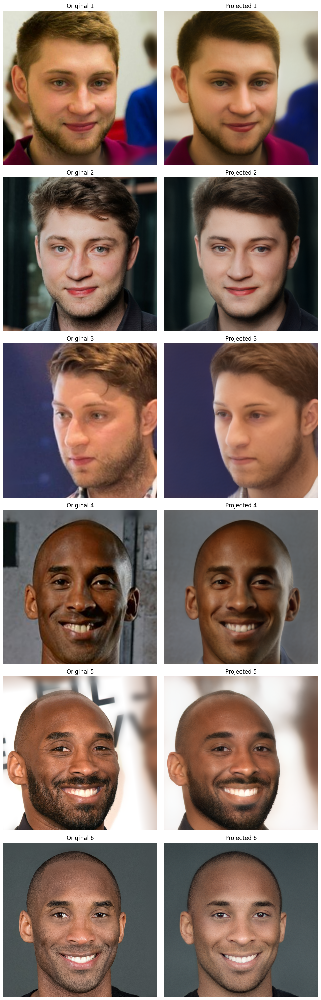

In [9]:
# Plotting all images together
n_images = len(original_imgs)
fig, axs = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))  # Adjust figsize as necessary

for i in range(n_images):
    axs[i, 0].imshow(original_imgs[i])
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original {i+1}")
    
    axs[i, 1].imshow(projected_imgs[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Projected {i+1}")

plt.tight_layout()
plt.show()

# Перенос стиля

Спроецируем картинки стиля в латентное пространство

In [10]:
STYLE_SAVE_PATH = os.path.join(os.pardir, "latents_styles")

# Lists to store image plots
style_original_imgs = []
style_projected_imgs = []
style_latents = []

for style_name in sorted(os.listdir(STYLES_DIR)):
    style_path = os.path.join(STYLES_DIR, style_name)
    style_orig_tensor, style_proj_tensor, style_latent = project_image_to_latent_space(style_path)
    
    style_original_imgs.append(get_image(style_orig_tensor))
    style_projected_imgs.append(get_image(style_proj_tensor))
    style_latent_vector = style_latent
    
    style_latents.append(style_latent_vector)
    style_latent_path = os.path.join(STYLE_SAVE_PATH, f"{style_name[:-4]}.pt")

    torch.save(style_latent_vector, style_latent_path)

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.69it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.69it/s]


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /home/ildar.azamatov/projects/itmo/itmo-generative-models/.venv/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:14<00:00,  6.69it/s]


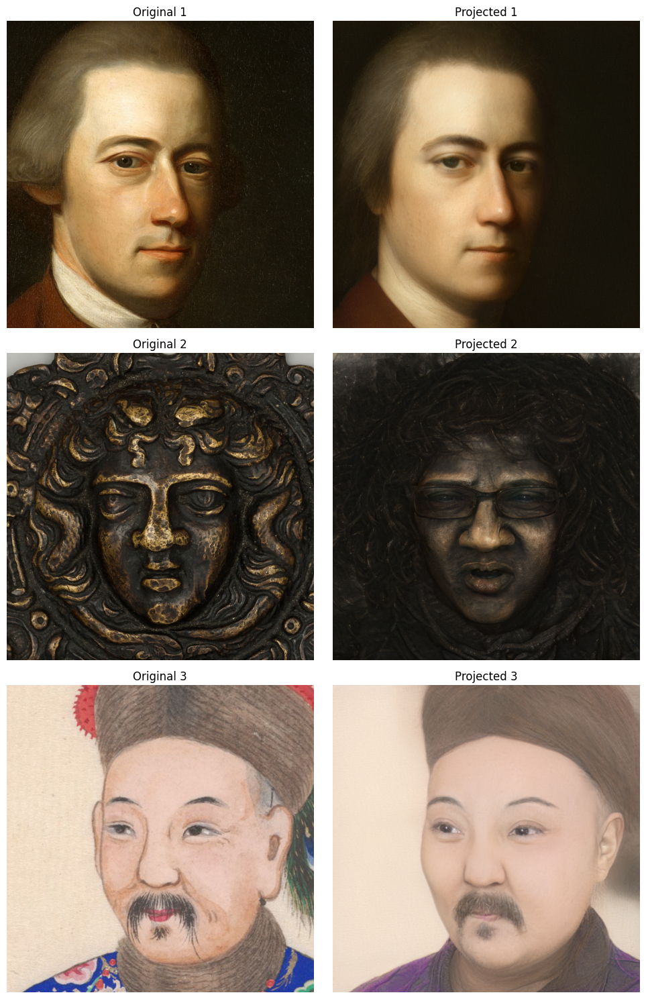

In [11]:
# Plotting all images together
n_images = len(style_original_imgs)
fig, axs = plt.subplots(n_images, 2, figsize=(10, 5 * n_images))  # Adjust figsize as necessary

for i in range(n_images):
    axs[i, 0].imshow(style_original_imgs[i])
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"Original {i+1}")
    
    axs[i, 1].imshow(style_projected_imgs[i])
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"Projected {i+1}")

plt.tight_layout()
plt.show()

In [12]:
def plot_interpolation_matrix(latents, style_latents, G, psi=0.5, indices=None):
    n_originals = len(latents)
    n_styles = len(style_latents)
    
    fig, axs = plt.subplots(n_originals, n_styles, figsize=(n_styles * 5, n_originals * 5))
    
    for i, orig_latent in enumerate(latents):
        for j, style_latent in enumerate(style_latents):
            interpolated_tensor = interpolate(orig_latent, style_latent, G, psi=psi, indeces=indices)
            img = get_image(interpolated_tensor)  # Assuming plot_image now returns an image object
            axs[i, j].imshow(img)
            axs[i, j].axis('off')
    
    plt.show()

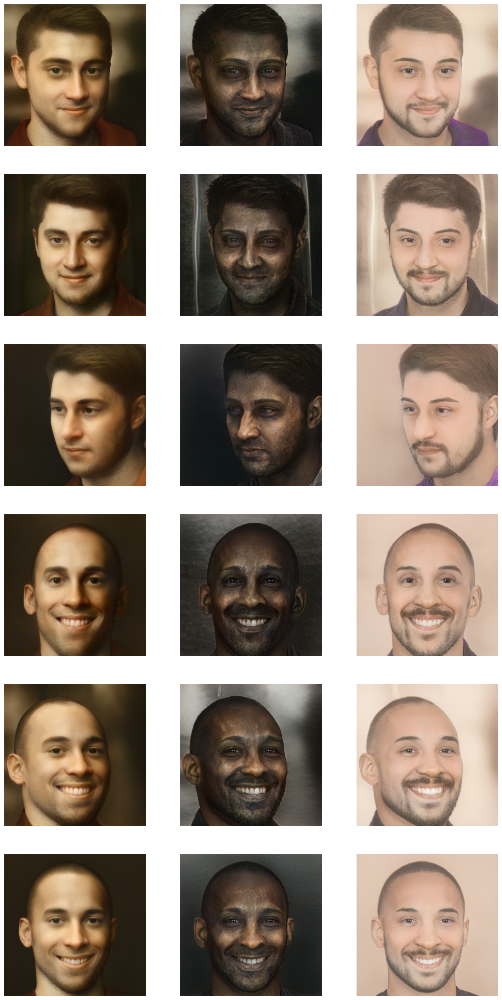

In [13]:
indices = [8, 9, 10, 11,12,13,14,15,16,17]
psi = 0.1

plot_interpolation_matrix(latents, style_latents, G, psi, indices)

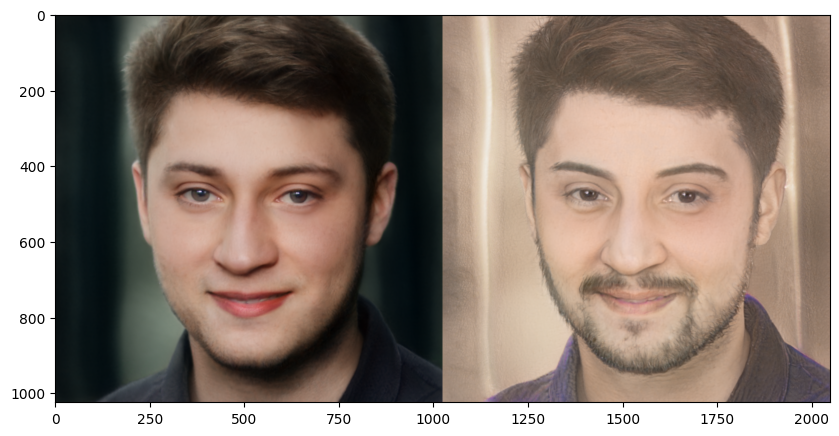

In [58]:
latent1=torch.load(os.path.join(SAVE_PATH, "babushkin", "2.pt")).to(device)
latent2=torch.load(os.path.join(SAVE_PATH, "kobebryant", "2.pt")).to(device)

indeces = [8, 9, 10, 11,12,13,14,15,16,17]
interpolate(latent1, latents[2].cuda(), G, psi=0.1, indeces=indeces)

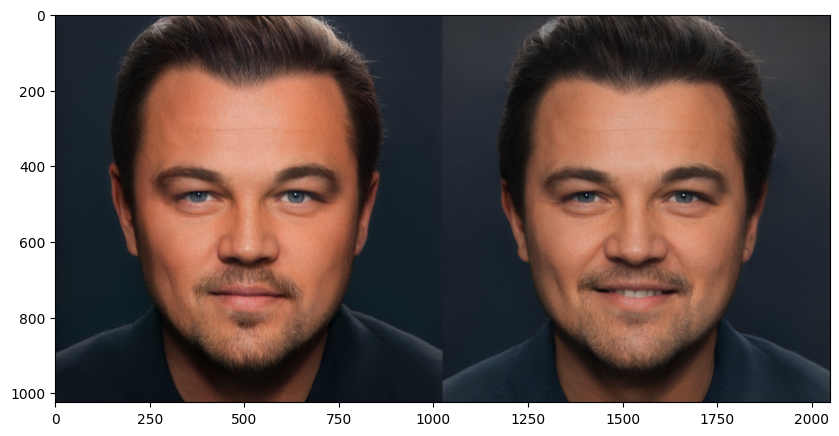

In [ ]:
latent1 = initial_latent_vector

latent2=torch.load("/content/editing/smile.pt").to(device) # 0.5, 1.5 indeces = [0,1,2,3,4,5,6]
latent2 = broadcast_w_sg(latent2)


# interactive(interpolate, latent1=fixed(latent1), latent2=fixed(latent2),
#             psi=widgets.FloatSlider(value=0.5, min=-1.0, max=1.0, step=0.1))


indeces = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
interpolate(latent1, latent2, psi=0.6, indeces=indeces)

# Homework

In [ ]:
file_id = '1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('ms1mv3_arcface_r50_fp16.pth')


In [ ]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from stylegan2_models.arcface_model import get_model
import torch.nn.functional as F
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms


def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor



class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, source, synth):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss

# https://drive.google.com/file/d/1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5/view?usp=sharing ссылка на загрузку весов
arcface_path = "/content/stylegan2-ada-pytorch/ms1mv3_arcface_r50_fp16.pth"
attr_path  = "/content/aligned_images/Stethem/0.jpg"
id_path = "/content/aligned_images/AJoly/0.jpg"


"""
  1 Взять 6 фотографии, наборе должны быть хотя бы 2 фото с разным поворотом головы
   - Делаем style transfer
   - Замена лиц с новым Arcface лоссом

  2. Expression Transfer


   # * заменить на полный кадр
  # https://github.com/zllrunning/face-parsing.PyTorch
"""


# .

In [ ]:
ninja
cmake
dlib
imageio-ffmpeg
lpips
pytorch_msssim
torch
pickle
scikit-learn
pandas
opencv-python
Pillow
matplotlib
